In [20]:
#!pip install pyswarms
#!pip install pygad
;


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 KB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.8/661.8 KB 62.7 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 KB 10.5 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


''

In [21]:
import pandas as pd
import pygad
import pyswarms as ps
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import random

In [179]:
random.seed(314592654)
function_inputs = [0,0]

In [180]:
#Función de las seis jorobas de camello 

def seisJorobas(x : [float, float], solution_idx = 0):
    """
    seisJorobas calcula el resultado de la función de prueba de las seis jorobas de camello para x1, x2.
    :param x: Dos número reales entre [-5,5] en una lista. E.g [1,2].
    :return: Resultado de x1, x2 para la función. 
    """
    x1 : float = x[0]
    x2 : float = x[1]

    term1 : float = 2*(x1**2)
    term2 : float = -1.05*(x1**4)
    term3 : float = (x1**6)/6
    term4 : float = x1*x2
    term5 : float = x2**2

    y : float = term1 + term2 + term3 + term4 + term5
    fitness_y : float = -(100 * y)
    return fitness_y

Funciones de fitness para la función objetivo. 

In [181]:
fitness_function = seisJorobas

num_generations = 50
num_parents_mating = 4

sol_per_pop = 8
num_genes = len(function_inputs)

init_range_low = -5
init_range_high = 5

parent_selection_type = "sss"
keep_parents = 1

crossover_type = "single_point"

mutation_type = "random"
mutation_percent_genes = 10

In [193]:
ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=seisJorobas,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       mutation_percent_genes=mutation_percent_genes,
                       save_solutions=True)

/root/venv/lib/python3.9/site-packages/pygad/pygad.py:522: UserWarning: The percentage of genes to mutate (mutation_percent_genes=10) resutled in selecting (0) genes. The number of genes to mutate is set to 1 (mutation_num_genes=1).
If you do not want to mutate any gene, please set mutation_type=None.
  if not self.suppress_warnings: warnings.warn("The percentage of genes to mutate (mutation_percent_genes={mutation_percent}) resutled in selecting ({mutation_num}) genes. The number of genes to mutate is set to 1 (mutation_num_genes=1).\nIf you do not want to mutate any gene, please set mutation_type=None.".format(mutation_percent=mutation_percent_genes, mutation_num=mutation_num_genes))
/root/venv/lib/python3.9/site-packages/pygad/pygad.py:940: UserWarning: Use the 'save_solutions' parameter with caution as it may cause memory overflow when either the number of generations, number of genes, or number of solutions in population is large.
  if not self.suppress_warnings: warnings.warn("Us

In [194]:
ga_instance.run()

In [195]:
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))

prediction = np.sum(np.array(function_inputs)*solution)
print("Predicted output based on the best solution : {prediction}".format(prediction=prediction))

Parameters of the best solution : [-1.73518109  0.90656223]
Fitness value of the best solution = -30.102934267097158
Predicted output based on the best solution : 0.0


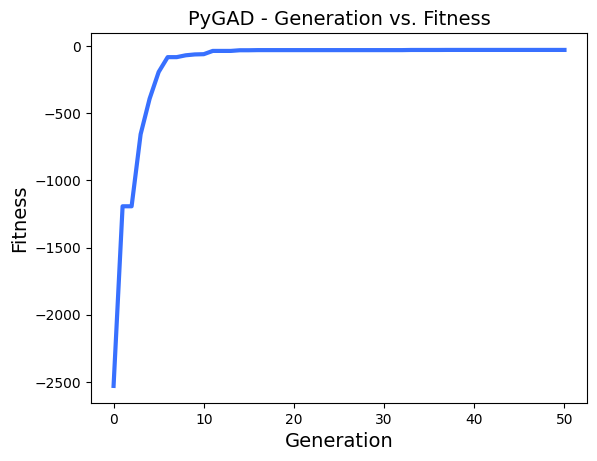

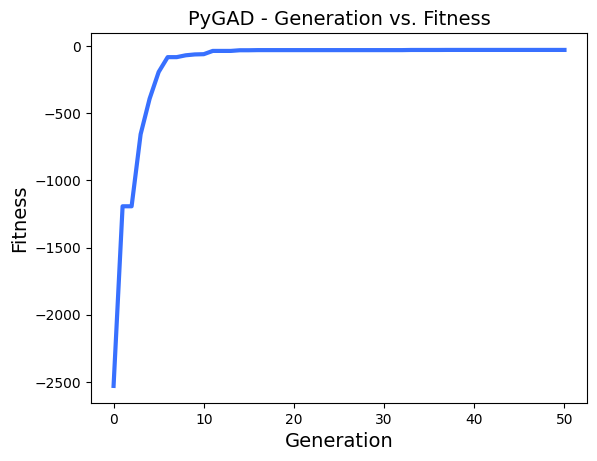

In [196]:
ga_instance.plot_fitness()

In [197]:
ga_instance.best_solution()

(array([-1.73518109,  0.90656223]), -30.102934267097158, 0)

In [198]:
soluciones = ga_instance.solutions
len(soluciones)

408

In [199]:
j = 1
Pob = np.array(soluciones[j*8:(j+1)*8])
Pob

array([[-2.11363864, -3.79798994],
       [-2.11363864,  4.81257482],
       [ 1.24191371, -4.407337  ],
       [-0.3603453 ,  3.6036923 ],
       [-2.11363864, -3.45219319],
       [ 0.451307  ,  4.53900726],
       [-0.8106228 , -4.88042852],
       [-2.75596962,  2.69374368]])

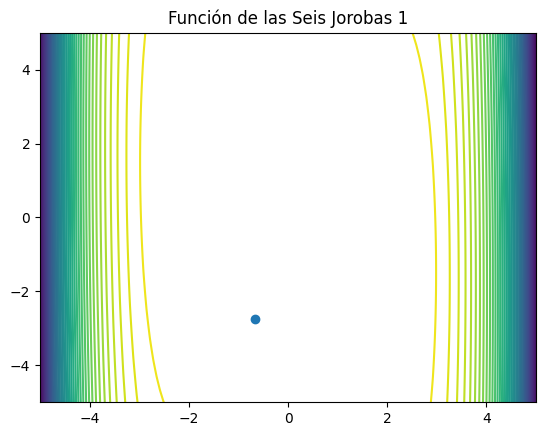

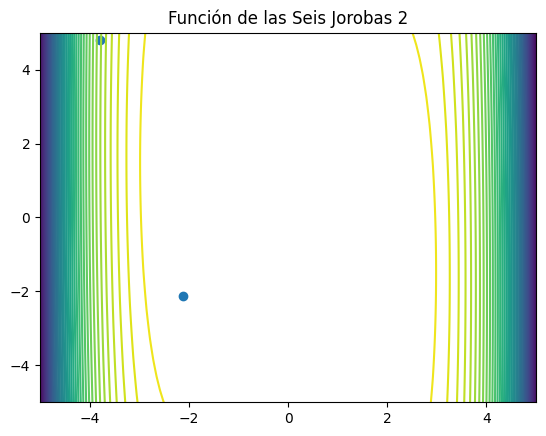

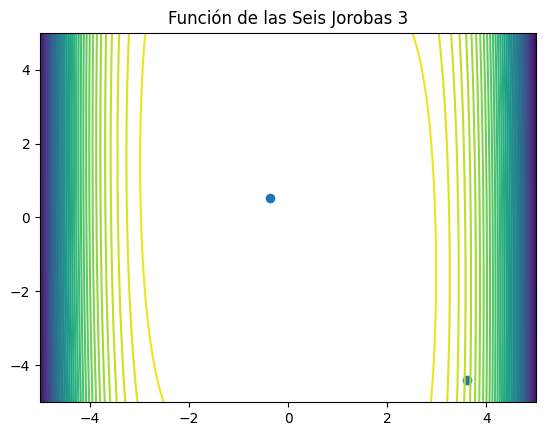

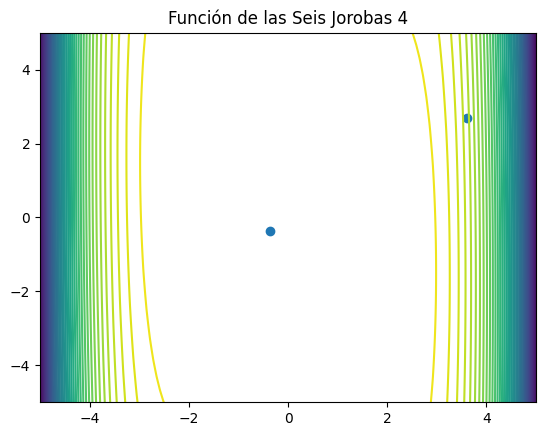

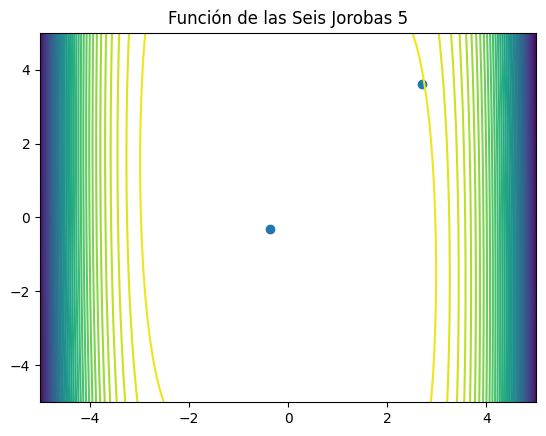

...

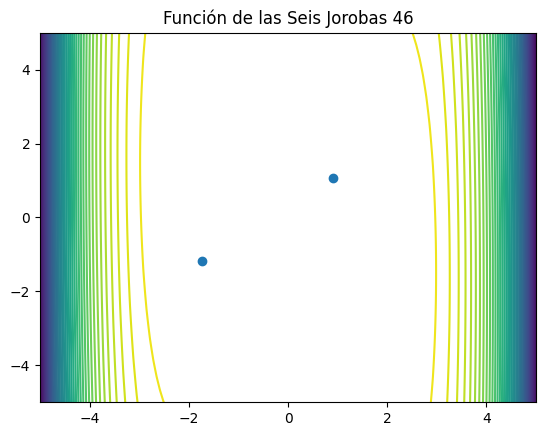

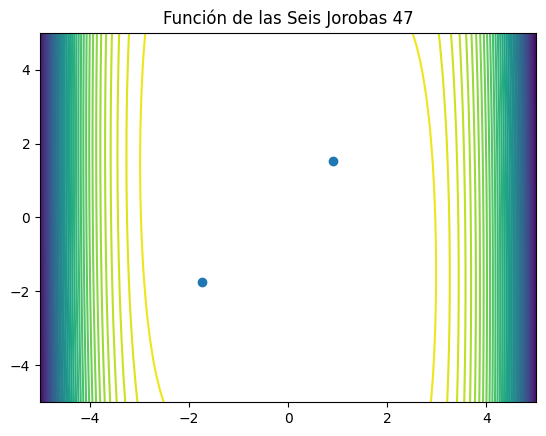

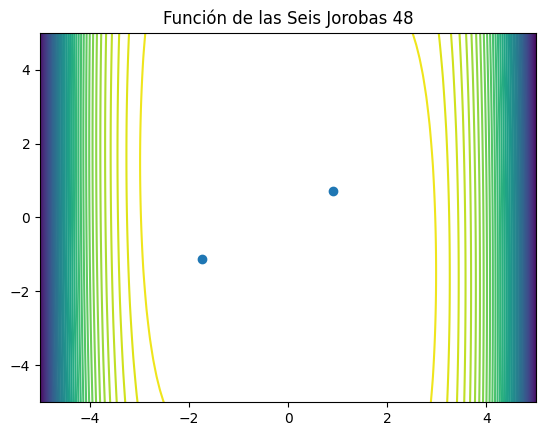

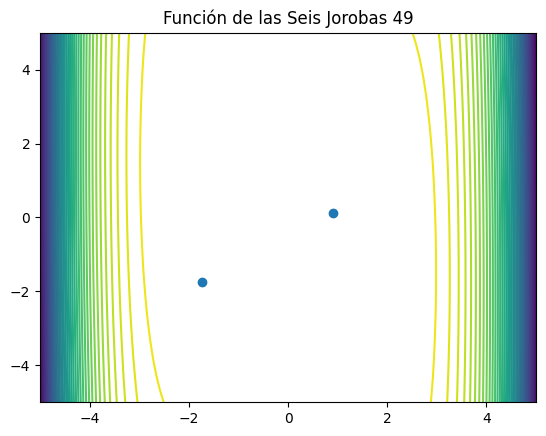

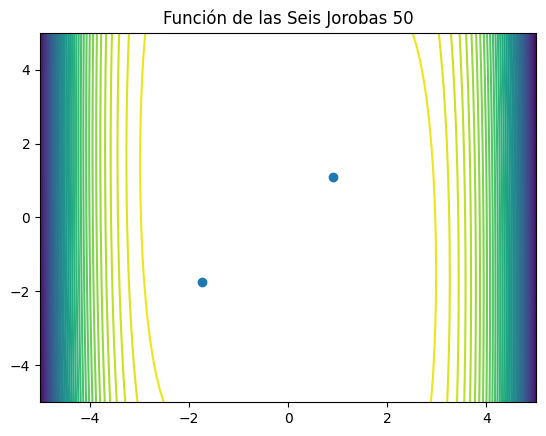

In [200]:
ncols = 150
nrows = 150
X = np.linspace(-5, 5, ncols)     
Y = np.linspace(-5, 5, nrows)     
X, Y = np.meshgrid(X, Y) 

Z = [seisJorobas(np.array([X[i,j], Y[i,j]]),0) for i in range(nrows) for j in range(ncols)]
Z = np.array(Z).reshape([nrows,ncols])

for j in range(num_generations):
    Pob = np.array(soluciones[j*8:(j+1)*8])
    fig, ax = plt.subplots()
    ax.contour(X,Y,Z, levels = 50)
    ax.scatter(Pob[0], Pob[1])
    plt.title("Función de las Seis Jorobas " + str(j+1))
    plt.show()

In [201]:
%matplotlib inline

''

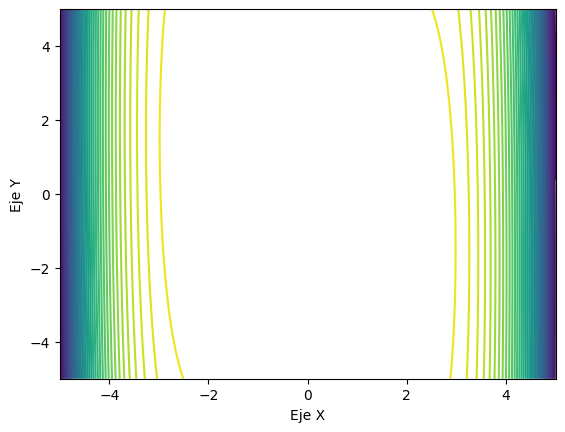

In [202]:
fig, ax = plt.subplots()

ax.set_xlim(( -5, 5))
ax.set_ylim((-5, 5))
ax.contour(X,Y,Z, levels = 50)
scatter, = ax.plot([], [], lw=2)
ax.set_xlabel("Eje X")
ax.set_ylabel("Eje Y")
;

In [225]:
# initialization function: plot the background of each frame

def init():
    scatter.set_data([], [])
    return (scatter,)

In [227]:
# animation function. This is called sequentially
def animate(i):
    ax.set_title("Paso "+ str(i+1))
    Pob = np.array(soluciones[i*8:(i+1)*8])
    scatter.set_data(Pob[:,0],Pob[:,1])
    return (scatter, )

In [228]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=50, interval=10, blit=True)

In [229]:
anim.save('seisJorobas.gif', writer='imagemagick')


2023-02-25 02:35:15,828 - matplotlib.animation - WARNING - MovieWriter imagemagick unavailable; using Pillow instead.
2023-02-25 02:35:15,829 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


Rosenbrock

In [1]:
import numpy as np
def rosenbrock(solution, solutionidx = 0):
    x = solution
    x1 = x[0]
    x2 = x[1]
    factor1 = 100*(x2-x1 ** 2)** 2
    factor2 = (1 -x1) ** 2
    output = np.sum(factor1 + factor2)
    return(output)

In [2]:
print(rosenbrock([1,2]))

100


In [5]:
def rosenBrock(x, solutionidx=0):
    f = (1 - x[:, 0]) ** 2 + 100 * (x[:, 1] - x[:, 0] ** 2) ** 2
    return f

In [17]:
print(rosenBrock(np.array([[1,2],[1,2]])))

[100 100]


## Optimización por particulas

In [41]:
%%time
from pyswarms.utils.functions import single_obj as fx

options = {'c1': 0.3, 'c2': 0.5, 'w':0.9}

optimizer = ps.single.GlobalBestPSO(n_particles=10, dimensions=2, options=options)
iters : int = 100
cost, pos = optimizer.optimize(rosenBrock, iters)

2023-02-25 00:45:14,950 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.3, 'c2': 0.5, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=1.68e-5
2023-02-25 00:45:15,123 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 1.6788799564801662e-05, best pos: [1.00398668 1.00789463]
CPU times: user 108 ms, sys: 28.9 ms, total: 137 ms
Wall time: 182 ms


In [42]:
psPosHistory = optimizer.pos_history
psPosHistory

[array([[0.67774078, 0.24001005],
        [0.68822154, 0.12724834],
        [0.70520434, 0.52079034],
        [0.33241868, 0.03580909],
        [0.5442441 , 0.57401448],
        [0.03864927, 0.32669233],
        [0.51993086, 0.63879799],
        [0.97971135, 0.04263989],
        [0.8829099 , 0.89025687],
        [0.49848479, 0.73710584]]),
 array([[1.42002111, 0.95538404],
        [1.46919525, 0.55445324],
        [0.74435377, 1.02279434],
        [1.01847239, 0.82930219],
        [0.74786369, 1.38138342],
        [0.16169593, 0.48661317],
        [1.1920032 , 1.26987853],
        [1.60507623, 0.19375395],
        [1.07692454, 1.58975992],
        [1.14130283, 1.11384681]]),
 array([[2.05450588, 1.18987741],
        [1.72069331, 0.91850771],
        [0.75616292, 1.3142699 ],
        [1.34937898, 1.3140984 ],
        [0.90381257, 1.87592301],
        [0.3013344 , 0.63511015],
        [1.71596335, 1.82859792],
        [1.99977315, 0.3711296 ],
        [1.21561195, 1.68606159],
        [1

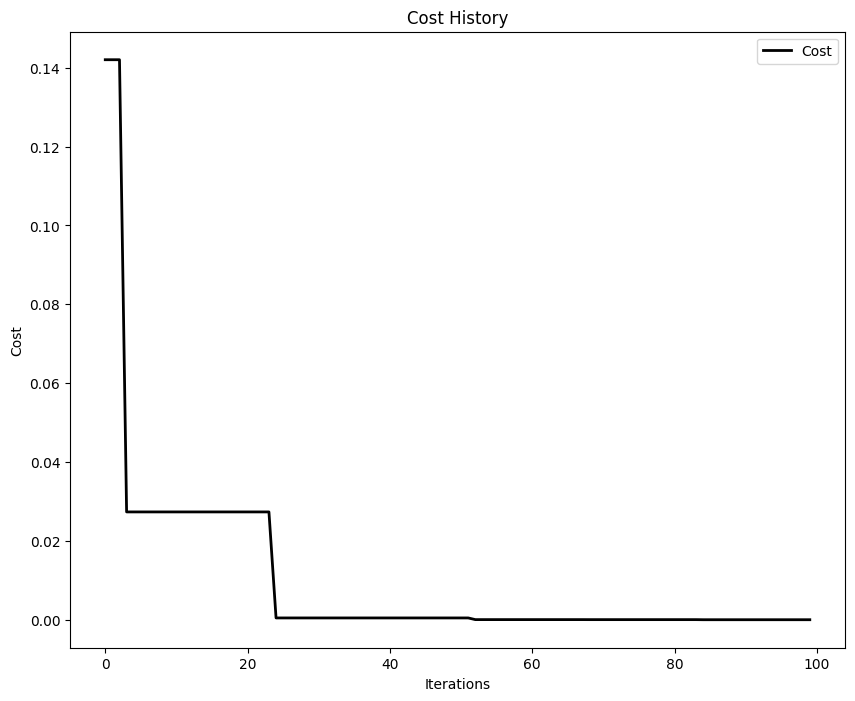

In [65]:
from pyswarms.utils.plotters import plot_cost_history, plot_contour, plot_surface
plot_cost_history(cost_history=optimizer.cost_history)
plt.show()

In [234]:
from IPython.display import Image
from pyswarms.utils.plotters.formatters import Mesher
from pyswarms.utils.plotters.formatters import Designer


In [235]:
m = Mesher(func=rosenBrock,limits=[(-3,3), (-3,3)],levels=50, delta=0.01) 
d = Designer(limits=[(-3,3), (-3,3)], label=['x-axis', 'y-axis', 'z-axis'])

In [236]:
%%capture
# Make animation
anim = plot_contour(pos_history=psPosHistory, 
                         mesher=m, designer=d,
                         mark=(1,1))

In [237]:
anim.save('rosenbrockSwarm.gif', writer='imagemagick', fps=10)
Image(url='rosenbrockSwarm.gif')


2023-02-25 02:52:28,954 - matplotlib.animation - WARNING - MovieWriter imagemagick unavailable; using Pillow instead.
--- Logging error ---
Traceback (most recent call last):
  File "/shared-libs/python3.9/py/lib/python3.9/site-packages/matplotlib/animation.py", line 1036, in save
    writer_cls = writers[writer]
  File "/shared-libs/python3.9/py/lib/python3.9/site-packages/matplotlib/animation.py", line 148, in __getitem__
    raise RuntimeError(f"Requested MovieWriter ({name}) not available")
RuntimeError: Requested MovieWriter (imagemagick) not available

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.9/logging/handlers.py", line 73, in emit
    if self.shouldRollover(record):
  File "/usr/local/lib/python3.9/logging/handlers.py", line 195, in shouldRollover
    self.stream.seek(0, 2)  #due to non-posix-compliant Windows feature
OSError: [Errno 116] Stale file handle
Call stack:
  File "/usr/loca

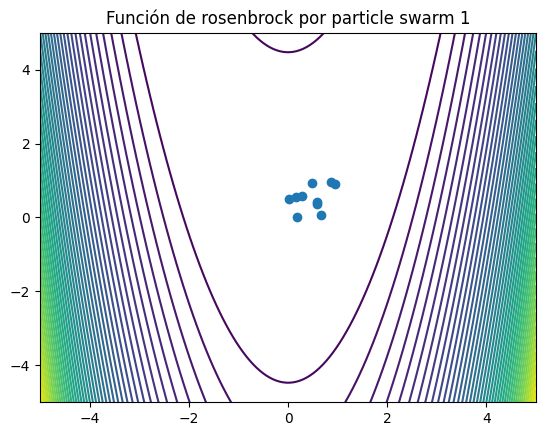

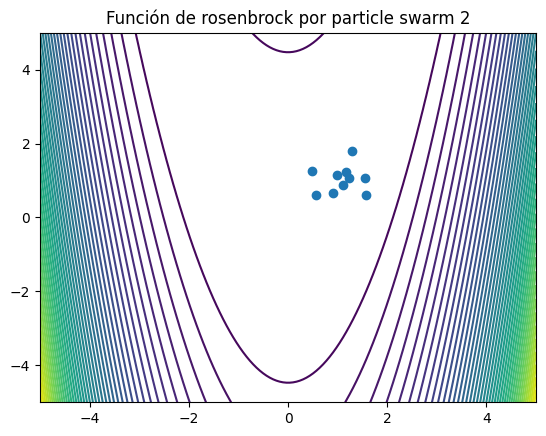

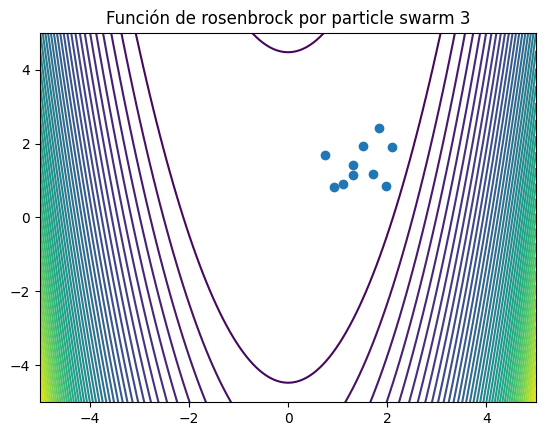

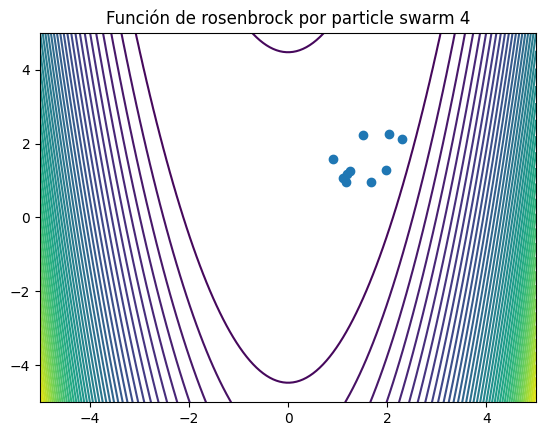

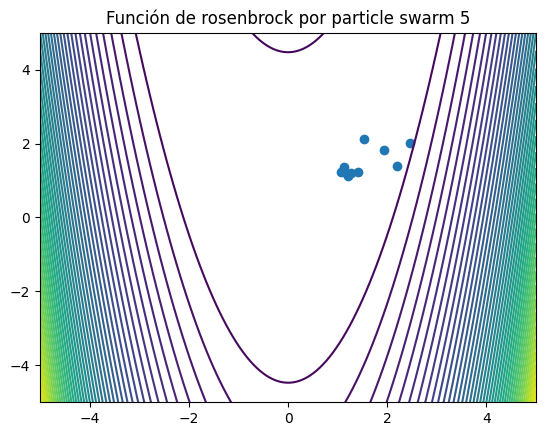

...

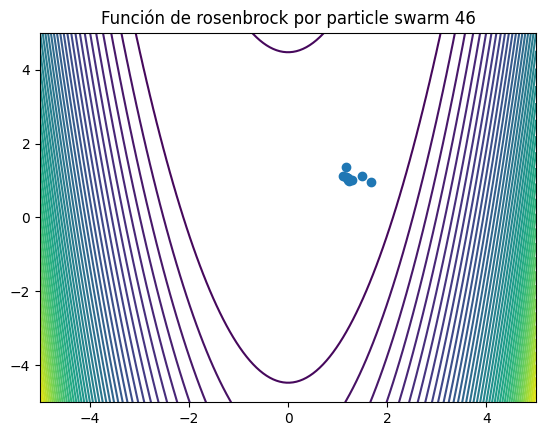

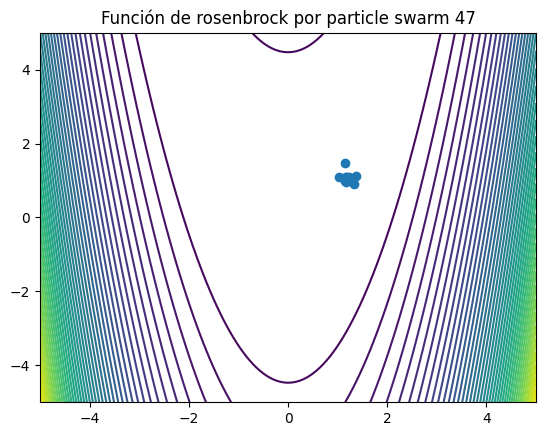

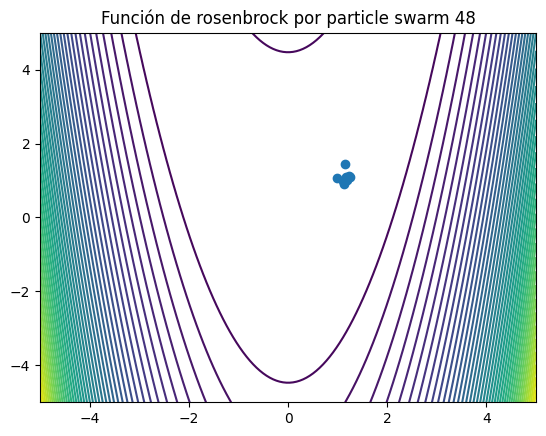

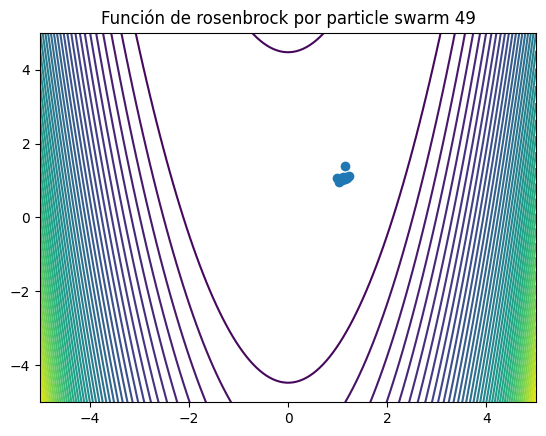

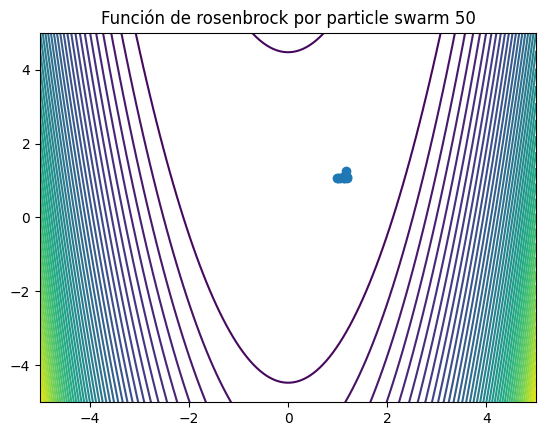

In [ ]:
ncols = 150
nrows = 150
X = np.linspace(-5, 5, ncols)     
Y = np.linspace(-5, 5, nrows)     
X, Y = np.meshgrid(X, Y) 

Z = [rosenbrock(np.array([X[i,j], Y[i,j]]),0) for i in range(nrows) for j in range(ncols)]
Z = np.array(Z).reshape([nrows,ncols])

for j in range(50):
    Pob = psPosHistory[j]
    fig, ax = plt.subplots()
    ax.contour(X,Y,Z, levels = 50)
    ax.scatter(Pob[:,0], Pob[:,1])
    plt.title("Función de rosenbrock por particle swarm " + str(j+1))
    plt.show()

Solución al Traveling Salesman Problem

Importamos la base de datos de los municipios a visitar con sus coordenadas

In [ ]:
df = pd.read_csv("ciudades.csv")
df

,Cod Mun,Municipio,Cod Dep,Departamento,Latitud,Longitud
0,63001,Armenia,63,Quindio,4.533889,-75.681111
1,8001,Barranquilla,8,Atlantico,10.963889,-74.796389
2,11001,Bogota D.C.,25,Cundinamarca,4.600000,-74.083333
3,68001,Bucaramanga,68,Santander,7.129722,-73.125833
4,13001,Cartagena,13,Bolivar,10.399722,-75.514444
5,54001,Cucuta,54,Norte de Santander,7.883333,-72.505278
6,5129,Caldas,5,Antioquia,6.090000,-75.635568
7,5001,Medellin,5,Antioquia,6.291389,-75.536111
8,23001,Monteria,23,Cordoba,8.757500,-75.890000
9,76520,Palmira,76,Valle del Cauca,3.539444,-76.303611


Procedemos a construír la matriz de costos. La entrada i,j de esta matriz contendrá el costo en pesos de ir de la ciudad i a la ciudad j. Éste, a su vez es la suma del salario por horas del vendedor, costo de los peajes y el costo del combustible en valores del 2023.

Costo hora del vendedor: El salario promedio de un conductor en colombia es de $6.827/hora [https://co.talent.com/salary?job=conductor#:~:text=¿Cuánto%20gana%20un%20Conductor%20en%20Colombia%3F&text=El%20salario%20conductor%20promedio%20en,con%20un%20ingreso%20de%20%2413.200.].

Costo de los peajes: Se estableció el costo de los peajes, el tiempo estimado de viaje y la distancia para cada par de ciudades.[https://viajaporcolombia.com/peajes/]

Costo del combustible: El recorrido se hará en un Mini Cooper 1.6, cuyo rendimiento es de 8,35 litros / 100 km [https://www.spritmonitor.de/es/detalle/125236.html?cdetail=1]. Además, el costo promedio de un litro de gasolina corriente en colombia es de $2.747,31/litro [https://es.globalpetrolprices.com/Colombia/gasoline_prices/#:~:text=El%20valor%20medio%20durante%20este,de%209%2C081.45%20(Colombian%20Peso).]. 

Importamos las tablas de tiempo de viaje, costo de los peajes y distancia entre ciudades.

In [19]:
df_tiempos = pd.read_csv("tiempos.csv")
df_tiempos

,Tiempo viaje,Armenia,Barranquilla,Bogota D.C.,Bucaramanga,Cartagena,Cucuta,Caldas,Medellin,Monteria,Palmira,Pereira,Pasto,Soledad,Tulua,Valledupar
0,Armenia,0.00,18.05,5.61,9.91,17.05,14.91,5.25,5.25,14.70,2.79,1.00,9.61,18.05,2.79,14.77
1,Barranquilla,18.05,0.00,17.95,9.17,2.03,12.22,12.03,12.03,6.12,18.98,16.17,26.00,0.00,18.98,5.58
2,Bogota D.C.,5.61,17.95,0.00,7.60,19.17,11.50,8.17,8.17,15.50,8.68,6.08,15.16,17.95,8.68,12.82
3,Bucaramanga,9.91,9.17,7.60,0.00,11.82,4.95,8.20,8.20,11.80,14.08,9.87,19.60,9.17,14.08,7.15
4,Cartagena,17.05,2.03,19.17,11.82,0.00,13.34,11.80,11.80,5.10,19.47,15.90,26.00,2.03,19.47,6.92
5,Cucuta,14.91,12.22,11.50,4.95,13.34,0.00,11.38,11.38,14.47,17.15,14.52,24.00,12.22,17.15,9.60
6,Caldas,5.25,12.03,8.17,8.20,11.80,11.38,0.00,0.00,7.42,7.75,4.08,14.48,12.03,7.75,11.55
7,Medellin,5.25,12.03,8.17,8.20,11.80,11.38,0.00,0.00,7.42,7.75,4.08,14.48,12.03,7.75,11.55
8,Monteria,14.70,6.12,15.50,11.80,5.10,14.47,7.42,7.42,0.00,14.52,12.12,21.97,6.12,14.52,7.88
9,Palmira,2.79,18.98,8.68,14.08,19.47,17.15,7.75,7.75,14.52,0.00,4.13,7.27,18.98,0.00,16.83


In [20]:
df_peajes = pd.read_csv("peajes.csv")
df_peajes

,Costo Peajes,Armenia,Barranquilla,Bogota D.C.,Bucaramanga,Cartagena,Cucuta,Caldas,Medellin,Monteria,Palmira,Pereira,Pasto,Soledad,Tulua,Valledupar
0,Armenia,0.0,138800.0,55400.0,72600.0,164500.0,87700.0,57500.0,57500.0,134200.0,49600.0,15300.0,78500.0,138800.0,49600.0,100000.0
1,Barranquilla,138800.0,0.0,142500.0,88100.0,33500.0,68700.0,112400.0,112400.0,41000.0,193300.0,141900.0,222200.0,0.0,193300.0,49300.0
2,Bogota D.C.,55400.0,142500.0,0.0,55100.0,130800.0,42600.0,74800.0,112400.0,137900.0,104900.0,70700.0,133900.0,142500.0,104900.0,103700.0
3,Bucaramanga,72600.0,88100.0,55100.0,0.0,76400.0,15100.0,70100.0,70100.0,86600.0,127100.0,75700.0,156000.0,88100.0,127100.0,49300.0
4,Cartagena,164500.0,33500.0,130800.0,76400.0,0.0,57000.0,107000.0,107000.0,54500.0,200600.0,149200.0,229500.0,33500.0,200600.0,37600.0
5,Cucuta,87700.0,68700.0,42600.0,15100.0,57000.0,0.0,85200.0,85200.0,67200.0,142200.0,90800.0,171100.0,68700.0,142200.0,29900.0
6,Caldas,57500.0,112400.0,74800.0,70100.0,107000.0,85200.0,0.0,0.0,90700.0,93600.0,42200.0,122500.0,112400.0,93600.0,97500.0
7,Medellin,57500.0,112400.0,74800.0,70100.0,107000.0,85200.0,0.0,0.0,90700.0,93600.0,42200.0,122500.0,112400.0,93600.0,97500.0
8,Monteria,134200.0,41000.0,137900.0,86600.0,54500.0,67200.0,90700.0,90700.0,0.0,170300.0,118900.0,199200.0,41000.0,170300.0,47800.0
9,Palmira,49600.0,193300.0,104900.0,127100.0,200600.0,142200.0,93600.0,93600.0,170300.0,0.0,51400.0,38600.0,193300.0,0.0,154500.0


In [21]:
df_distancias = pd.read_csv("distancias.csv")
df_distancias

,Distancia,Armenia,Barranquilla,Bogota D.C.,Bucaramanga,Cartagena,Cucuta,Caldas,Medellin,Monteria,Palmira,Pereira,Pasto,Soledad,Tulua,Valledupar
0,Armenia,0.0,968.0,282.0,594.0,903.0,804.0,268.0,268.0,663.0,180.0,48.0,559.0,968.0,180.0,949.0
1,Barranquilla,968.0,0.0,979.0,585.0,120.0,657.0,702.0,702.0,353.0,1252.0,1050.0,1631.0,0.0,1252.0,295.0
2,Bogota D.C.,282.0,979.0,0.0,407.0,1050.0,557.0,443.0,443.0,832.0,464.0,318.0,845.0,979.0,464.0,867.0
3,Bucaramanga,594.0,585.0,407.0,0.0,650.0,198.0,404.0,404.0,717.0,769.0,559.0,1140.0,585.0,769.0,449.0
4,Cartagena,903.0,120.0,1050.0,650.0,0.0,731.0,640.0,640.0,276.0,1063.0,849.0,1434.0,120.0,1063.0,365.0
5,Cucuta,804.0,657.0,557.0,198.0,731.0,0.0,598.0,598.0,795.0,954.0,747.0,1329.0,657.0,954.0,525.0
6,Caldas,268.0,702.0,443.0,404.0,640.0,598.0,0.0,0.0,405.0,425.0,215.0,802.0,702.0,425.0,745.0
7,Medellin,268.0,702.0,443.0,404.0,640.0,598.0,0.0,0.0,405.0,425.0,215.0,802.0,702.0,425.0,745.0
8,Monteria,663.0,353.0,832.0,717.0,276.0,795.0,405.0,405.0,0.0,825.0,621.0,1203.0,353.0,825.0,433.0
9,Palmira,180.0,1252.0,464.0,769.0,1063.0,954.0,425.0,425.0,825.0,0.0,210.0,388.0,1252.0,0.0,1116.0


Calculamos la tabla de costos del vendedor con la tabla de tiempos y su pago por hora.

In [49]:
pago_hora = 6827
df_costo_vendedor = df_tiempos.applymap(lambda x: x*pago_hora if not isinstance(x, str) else x )
df_costo_vendedor

,Tiempo viaje,Armenia,Barranquilla,Bogota D.C.,Bucaramanga,Cartagena,Cucuta,Caldas,Medellin,Monteria,Palmira,Pereira,Pasto,Soledad,Tulua,Valledupar
0,Armenia,0.00,123227.35,38299.47,67655.57,116400.35,101790.57,35841.75,35841.75,100356.90,19047.33,6827.00,65607.47,123227.35,19047.33,100834.79
1,Barranquilla,123227.35,0.00,122544.65,62603.59,13858.81,83425.94,82128.81,82128.81,41781.24,129576.46,110392.59,177502.00,0.00,129576.46,38094.66
2,Bogota D.C.,38299.47,122544.65,0.00,51885.20,130873.59,78510.50,55776.59,55776.59,105818.50,59258.36,41508.16,103497.32,122544.65,59258.36,87522.14
3,Bucaramanga,67655.57,62603.59,51885.20,0.00,80695.14,33793.65,55981.40,55981.40,80558.60,96124.16,67382.49,133809.20,62603.59,96124.16,48813.05
4,Cartagena,116400.35,13858.81,130873.59,80695.14,0.00,91072.18,80558.60,80558.60,34817.70,132921.69,108549.30,177502.00,13858.81,132921.69,47242.84
5,Cucuta,101790.57,83425.94,78510.50,33793.65,91072.18,0.00,77691.26,77691.26,98786.69,117083.05,99128.04,163848.00,83425.94,117083.05,65539.20
6,Caldas,35841.75,82128.81,55776.59,55981.40,80558.60,77691.26,0.00,0.00,50656.34,52909.25,27854.16,98854.96,82128.81,52909.25,78851.85
7,Medellin,35841.75,82128.81,55776.59,55981.40,80558.60,77691.26,0.00,0.00,50656.34,52909.25,27854.16,98854.96,82128.81,52909.25,78851.85
8,Monteria,100356.90,41781.24,105818.50,80558.60,34817.70,98786.69,50656.34,50656.34,0.00,99128.04,82743.24,149989.19,41781.24,99128.04,53796.76
9,Palmira,19047.33,129576.46,59258.36,96124.16,132921.69,117083.05,52909.25,52909.25,99128.04,0.00,28195.51,49632.29,129576.46,0.00,114898.41


Calculamos la tabla de costos de combustible

In [52]:
consumo = 8.35/100 #litro/km
precio_gasolina = 2747.31 #$/litro
costo_kilometro = precio_gasolina * consumo # $/km
df_costo_combustible = df_distancias.applymap(lambda x: float(x)*costo_kilometro if not isinstance(x, str) else x )
df_costo_combustible

229.40038499999997


,Distancia,Armenia,Barranquilla,Bogota D.C.,Bucaramanga,Cartagena,Cucuta,Caldas,Medellin,Monteria,Palmira,Pereira,Pasto,Soledad,Tulua,Valledupar
0,Armenia,0.000000e+00,2.220596e+05,64690.908570,136263.828690,207148.547655,184437.909540,61479.303180,61479.303180,152092.455255,41292.069300,11011.218480,128234.815215,222059.572680,41292.069300,217700.965365
1,Barranquilla,2.220596e+05,0.000000e+00,224582.976915,134199.225225,27528.046200,150716.052945,161039.070270,161039.070270,80978.335905,287209.282020,240870.404250,374152.027935,0.000000,287209.282020,67673.113575
2,Bogota D.C.,6.469091e+04,2.245830e+05,0.000000,93365.956695,240870.404250,127776.014445,101624.370555,101624.370555,190861.120320,106441.778640,72949.322430,193843.325325,224582.976915,106441.778640,198890.133795
3,Bucaramanga,1.362638e+05,1.341992e+05,93365.956695,0.000000,149110.250250,45421.276230,92677.755540,92677.755540,164480.076045,176408.896065,128234.815215,261516.438900,134199.225225,176408.896065,103000.772865
4,Cartagena,2.071485e+05,2.752805e+04,240870.404250,149110.250250,0.000000,167691.681435,146816.246400,146816.246400,63314.506260,243852.609255,194760.926865,328960.152090,27528.046200,243852.609255,83731.140525
5,Cucuta,1.844379e+05,1.507161e+05,127776.014445,45421.276230,167691.681435,0.000000,137181.430230,137181.430230,182373.306075,218847.967290,171362.087595,304873.111665,150716.052945,218847.967290,120435.202125
6,Caldas,6.147930e+04,1.610391e+05,101624.370555,92677.755540,146816.246400,137181.430230,0.000000,0.000000,92907.155925,97495.163625,49321.082775,183979.108770,161039.070270,97495.163625,170903.286825
7,Medellin,6.147930e+04,1.610391e+05,101624.370555,92677.755540,146816.246400,137181.430230,0.000000,0.000000,92907.155925,97495.163625,49321.082775,183979.108770,161039.070270,97495.163625,170903.286825
8,Monteria,1.520925e+05,8.097834e+04,190861.120320,164480.076045,63314.506260,182373.306075,92907.155925,92907.155925,0.000000,189255.317625,142457.639085,275968.663155,80978.335905,189255.317625,99330.366705
9,Palmira,4.129207e+04,2.872093e+05,106441.778640,176408.896065,243852.609255,218847.967290,97495.163625,97495.163625,189255.317625,0.000000,48174.080850,89007.349380,287209.282020,0.000000,256010.829660


Con estas matrices podemos calcular la matriz de costos totales de viajar entre dos ciudades

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=eafd788b-3e63-4104-b546-f06f4cef74a1' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>